In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/imagenet/imagenet/"
x = load(os.path.join(path, 'train/ILSVRC2012_val_00005012.JPEG'))
print(x.shape)

(375, 500, 3)


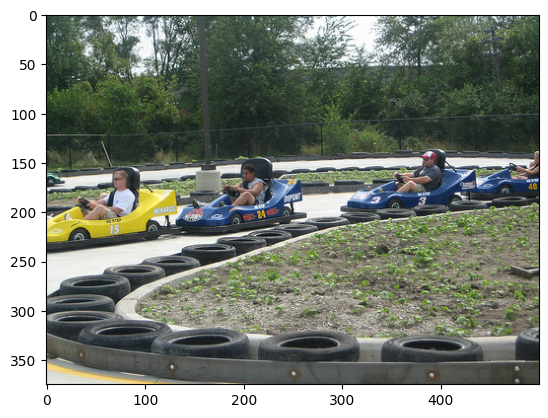

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

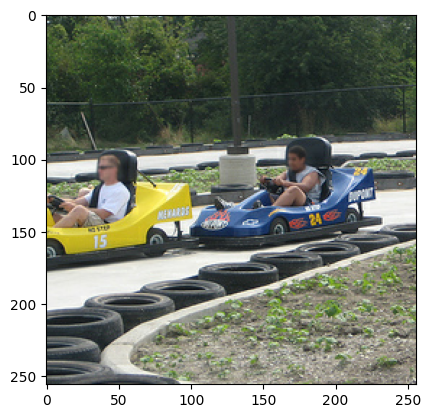

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

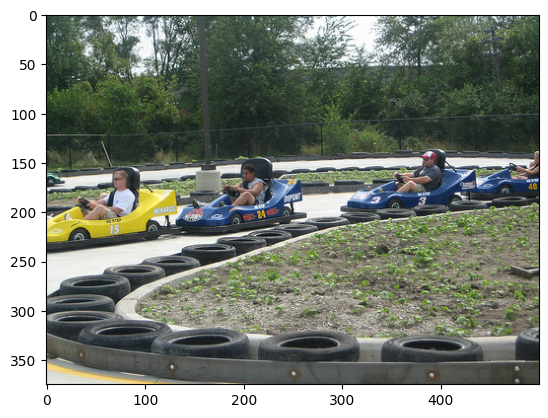

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.JPEG")
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
validation_dataset = tf.data.Dataset.list_files(path + 'val/*.JPEG')
validation_dataset = validation_dataset.take(2000)
validation_dataset = validation_dataset.map(load_test_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [21]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 188, 250, 3)


In [22]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 376, 500, 3)


In [23]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

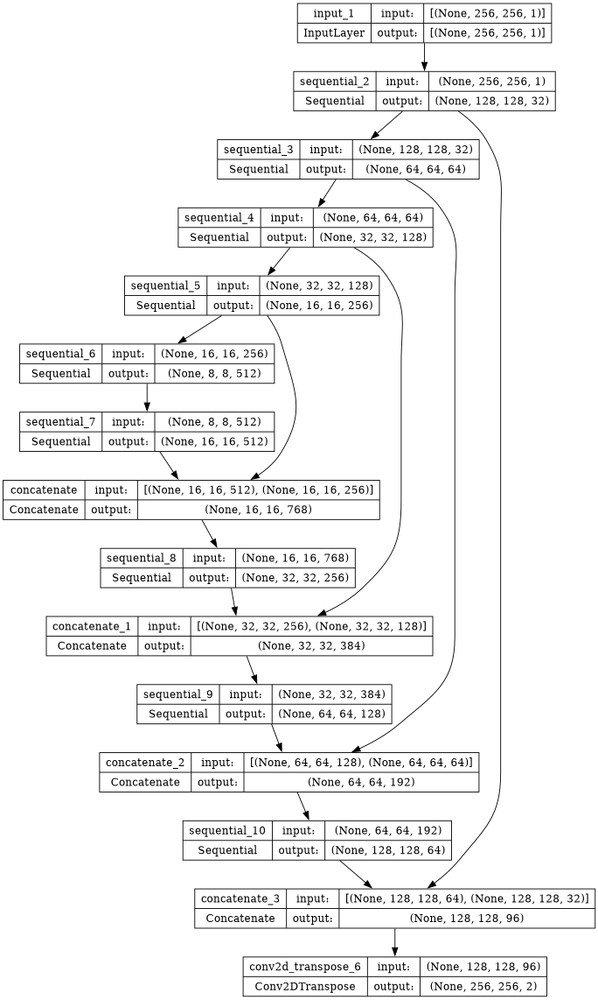

In [24]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [25]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

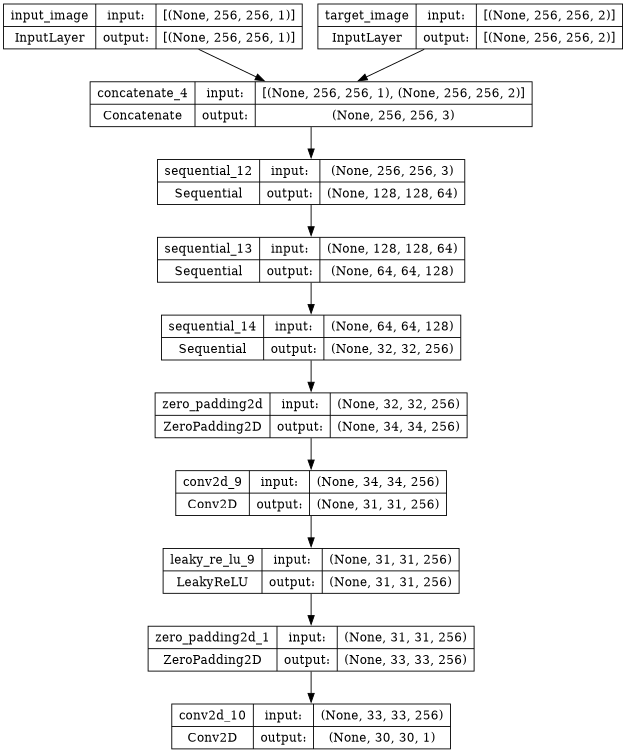

In [26]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [27]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [28]:
LAMBDA = 50

In [29]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [30]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 80*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [31]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [32]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [33]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [34]:
epochs = 250

In [35]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [36]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [37]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [38]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [39]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [40]:
os.mkdir('/kaggle/working/gen_output/')

In [41]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [42]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


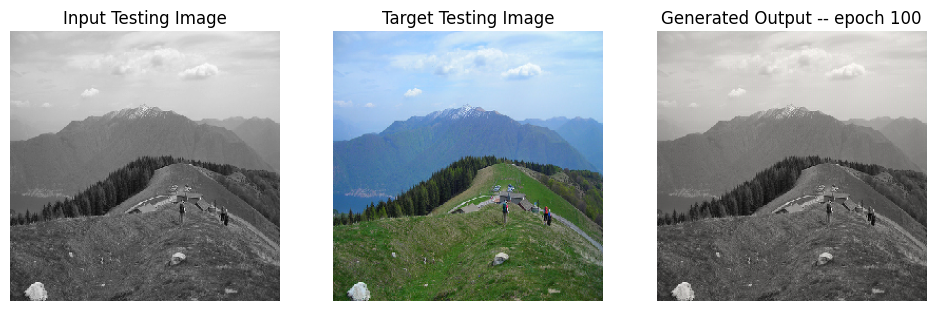

SSIM Score: 0.8698620796203613
PSNR Score: 19.338491439819336


In [43]:
display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000081.JPEG',100)

In [44]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 39000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000081.JPEG', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [45]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 1s 0us/step
Training Details
Generator-- total_loss:4.66813 gan_loss:1.09506 l1_loss:0.05403 perceptual_loss:0.01090 Discriminator-- total_loss:1.32543 real_loss:0.64527 generated_loss:0.68016 --- SSIM 0.81560 PSNR 21.34225 LPIPS 0.00000
Time taken for epoch 1 is 613.5103995800018 sec
Number of iteration 500
Validation Details
Generator-- total_loss:6.93119 gan_loss:0.97436 l1_loss:0.09840  perceptual_loss:0.01296 Discriminator-- total_loss:1.71196 real_loss:0.73642 generated_loss:0.97555 --- SSIM 0.80388 PSNR 17.23721 LPIPS 0.00000
Time taken for epoch 1 is 693.8838391304016 sec
Number of iteration 125
Displaying one random test image...


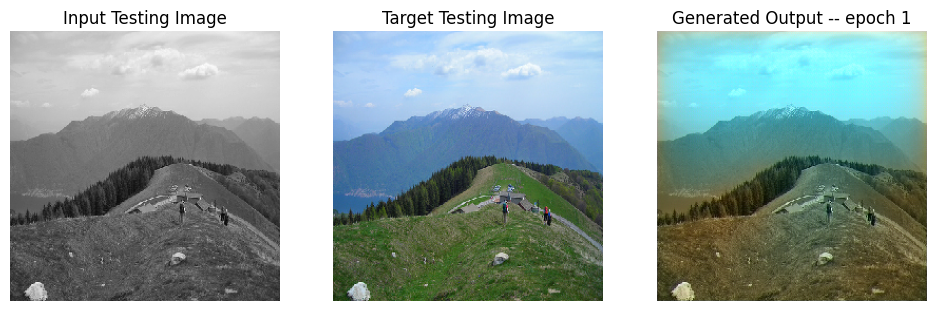

SSIM Score: 0.7862030863761902
PSNR Score: 19.33209228515625
Epoch 1
Training Details
Generator-- total_loss:4.53276 gan_loss:0.97946 l1_loss:0.05448 perceptual_loss:0.01036 Discriminator-- total_loss:1.34793 real_loss:0.66359 generated_loss:0.68434 --- SSIM 0.85962 PSNR 20.92571 LPIPS 0.00000
Time taken for epoch 2 is 598.0701110363007 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.51093 gan_loss:1.45870 l1_loss:0.10073  perceptual_loss:0.01270 Discriminator-- total_loss:1.98777 real_loss:0.60800 generated_loss:1.37978 --- SSIM 0.73847 PSNR 16.66822 LPIPS 0.00000
Time taken for epoch 2 is 679.3530738353729 sec
Number of iteration 125
Epoch 2
Training Details
Generator-- total_loss:4.45711 gan_loss:0.96507 l1_loss:0.05384 perceptual_loss:0.01000 Discriminator-- total_loss:1.35741 real_loss:0.66914 generated_loss:0.68827 --- SSIM 0.87278 PSNR 21.00158 LPIPS 0.00000
Time taken for epoch 3 is 598.3330833911896 sec
Number of iteration 500
Validation Details
Generat

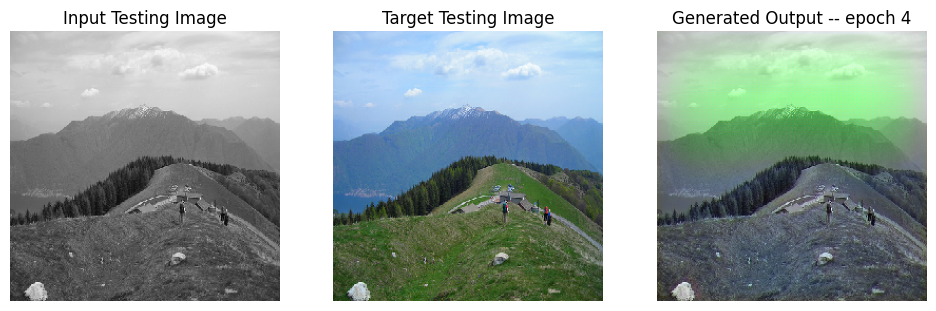

SSIM Score: 0.7958488464355469
PSNR Score: 17.023910522460938
Epoch 4
Training Details
Generator-- total_loss:4.42169 gan_loss:0.93628 l1_loss:0.05370 perceptual_loss:0.01001 Discriminator-- total_loss:1.32357 real_loss:0.65350 generated_loss:0.67007 --- SSIM 0.88123 PSNR 21.02541 LPIPS 0.00000
Time taken for epoch 5 is 592.4327747821808 sec
Number of iteration 500
Validation Details
Generator-- total_loss:6.85236 gan_loss:0.36160 l1_loss:0.10831  perceptual_loss:0.01344 Discriminator-- total_loss:1.76019 real_loss:1.37323 generated_loss:0.38696 --- SSIM 0.83425 PSNR 16.40783 LPIPS 0.00000
Time taken for epoch 5 is 673.7999632358551 sec
Number of iteration 125
Epoch 5
Training Details
Generator-- total_loss:4.37496 gan_loss:0.94801 l1_loss:0.05249 perceptual_loss:0.01003 Discriminator-- total_loss:1.33089 real_loss:0.65719 generated_loss:0.67370 --- SSIM 0.87754 PSNR 21.15595 LPIPS 0.00000
Time taken for epoch 6 is 589.3943514823914 sec
Number of iteration 500
Validation Details
Genera

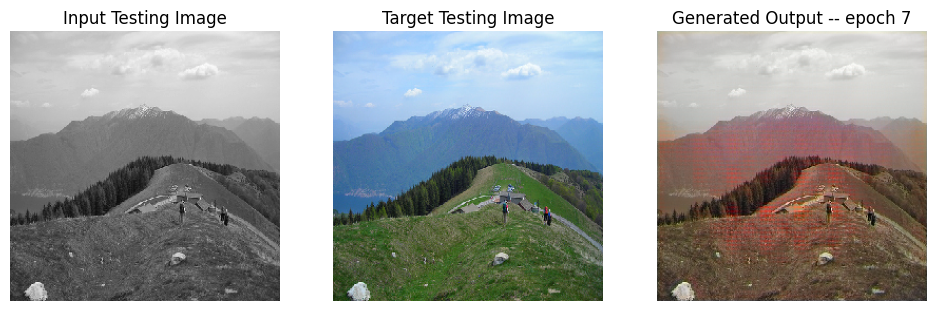

SSIM Score: 0.8368833661079407
PSNR Score: 17.52457618713379
Epoch 7
Training Details
Generator-- total_loss:4.43700 gan_loss:0.93816 l1_loss:0.05349 perceptual_loss:0.01030 Discriminator-- total_loss:1.32481 real_loss:0.65320 generated_loss:0.67161 --- SSIM 0.87210 PSNR 20.92840 LPIPS 0.00000
Time taken for epoch 8 is 591.8240976333618 sec
Number of iteration 500
Validation Details
Generator-- total_loss:13.23534 gan_loss:1.71033 l1_loss:0.19831  perceptual_loss:0.02012 Discriminator-- total_loss:1.02242 real_loss:0.36068 generated_loss:0.66174 --- SSIM 0.57799 PSNR 10.73369 LPIPS 0.00000
Time taken for epoch 8 is 672.711407661438 sec
Number of iteration 125
Epoch 8
Training Details
Generator-- total_loss:4.38753 gan_loss:0.91682 l1_loss:0.05327 perceptual_loss:0.01009 Discriminator-- total_loss:1.30458 real_loss:0.64033 generated_loss:0.66425 --- SSIM 0.87428 PSNR 21.00186 LPIPS 0.00000
Time taken for epoch 9 is 594.4292912483215 sec
Number of iteration 500
Validation Details
Generat

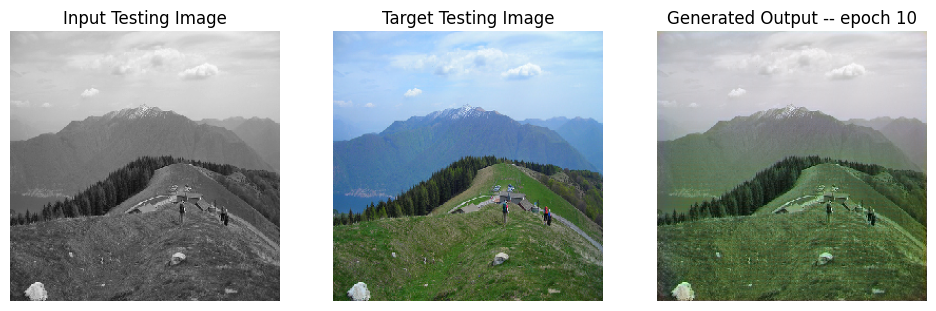

SSIM Score: 0.8835163116455078
PSNR Score: 20.460676193237305
Epoch 10
Training Details
Generator-- total_loss:3.45404 gan_loss:0.46716 l1_loss:0.04459 perceptual_loss:0.00947 Discriminator-- total_loss:1.94869 real_loss:1.24542 generated_loss:0.70326 --- SSIM 0.89114 PSNR 22.69214 LPIPS 0.00000
Time taken for epoch 11 is 529.9821619987488 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.80467 gan_loss:0.54115 l1_loss:0.04902  perceptual_loss:0.01015 Discriminator-- total_loss:2.01796 real_loss:1.06326 generated_loss:0.95470 --- SSIM 0.88879 PSNR 22.37786 LPIPS 0.00000
Time taken for epoch 11 is 610.590541601181 sec
Number of iteration 125
Epoch 11
Training Details
Generator-- total_loss:11.94937 gan_loss:8.96997 l1_loss:0.04456 perceptual_loss:0.00939 Discriminator-- total_loss:0.17055 real_loss:0.09070 generated_loss:0.07985 --- SSIM 0.88885 PSNR 22.64378 LPIPS 0.00000
Time taken for epoch 12 is 398.30407667160034 sec
Number of iteration 500
Validation Details


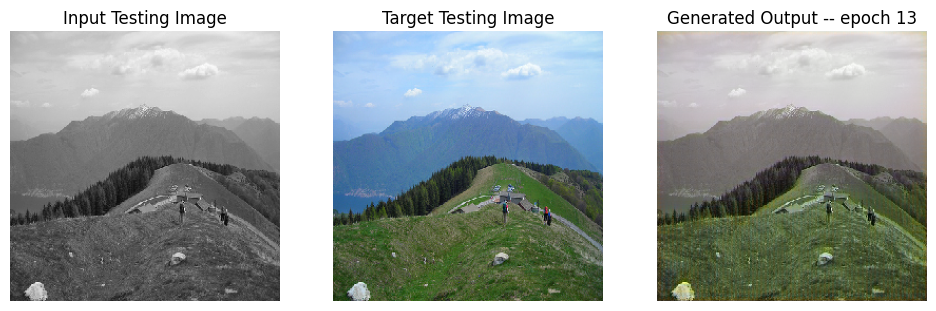

SSIM Score: 0.882823646068573
PSNR Score: 19.87808609008789
Epoch 13
Training Details
Generator-- total_loss:15.05760 gan_loss:12.08671 l1_loss:0.04437 perceptual_loss:0.00940 Discriminator-- total_loss:0.00051 real_loss:0.00024 generated_loss:0.00027 --- SSIM 0.88944 PSNR 22.66837 LPIPS 0.00000
Time taken for epoch 14 is 397.38973903656006 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.28598 gan_loss:0.00324 l1_loss:0.04916  perceptual_loss:0.01031 Discriminator-- total_loss:8.91927 real_loss:8.91715 generated_loss:0.00212 --- SSIM 0.88693 PSNR 22.28549 LPIPS 0.00000
Time taken for epoch 14 is 477.13655734062195 sec
Number of iteration 125
Epoch 14
Training Details
Generator-- total_loss:15.80129 gan_loss:12.79755 l1_loss:0.04493 perceptual_loss:0.00947 Discriminator-- total_loss:0.00036 real_loss:0.00017 generated_loss:0.00018 --- SSIM 0.88827 PSNR 22.58367 LPIPS 0.00000
Time taken for epoch 15 is 395.77339267730713 sec
Number of iteration 500
Validation Deta

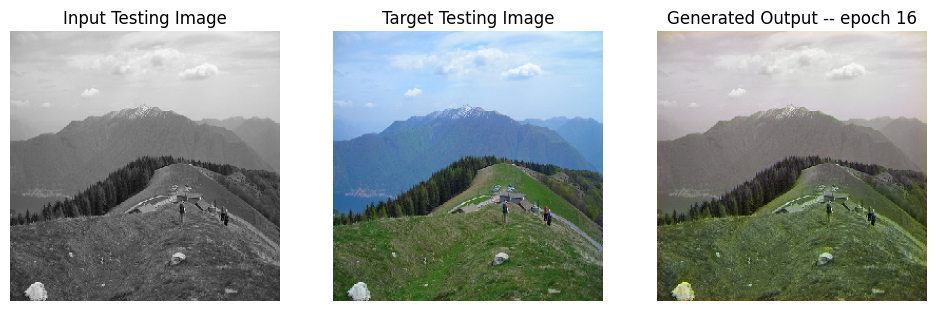

SSIM Score: 0.8827650547027588
PSNR Score: 19.83478546142578
Epoch 16
Training Details
Generator-- total_loss:17.38160 gan_loss:14.42692 l1_loss:0.04405 perceptual_loss:0.00940 Discriminator-- total_loss:0.00009 real_loss:0.00004 generated_loss:0.00005 --- SSIM 0.88999 PSNR 22.69907 LPIPS 0.00000
Time taken for epoch 17 is 395.74331307411194 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.26247 gan_loss:0.00077 l1_loss:0.04888  perceptual_loss:0.01022 Discriminator-- total_loss:11.01905 real_loss:11.01846 generated_loss:0.00060 --- SSIM 0.88719 PSNR 22.33722 LPIPS 0.00000
Time taken for epoch 17 is 475.7840359210968 sec
Number of iteration 125
Epoch 17
Training Details
Generator-- total_loss:17.87500 gan_loss:14.91478 l1_loss:0.04429 perceptual_loss:0.00932 Discriminator-- total_loss:0.00007 real_loss:0.00003 generated_loss:0.00004 --- SSIM 0.88923 PSNR 22.68248 LPIPS 0.00000
Time taken for epoch 18 is 397.7573525905609 sec
Number of iteration 500
Validation Det

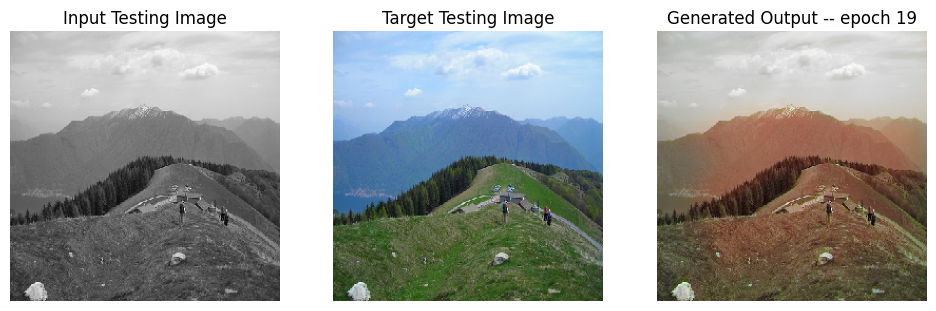

SSIM Score: 0.8680984377861023
PSNR Score: 16.97266387939453
Epoch 19
Training Details
Generator-- total_loss:2.80593 gan_loss:0.01199 l1_loss:0.04206 perceptual_loss:0.00864 Discriminator-- total_loss:11.03787 real_loss:11.03785 generated_loss:0.00002 --- SSIM 0.91348 PSNR 23.24716 LPIPS 0.00000
Time taken for epoch 20 is 529.6733667850494 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.34903 gan_loss:0.00003 l1_loss:0.05136  perceptual_loss:0.00976 Discriminator-- total_loss:17.48597 real_loss:17.48590 generated_loss:0.00007 --- SSIM 0.90447 PSNR 22.21879 LPIPS 0.00000
Time taken for epoch 20 is 610.7170100212097 sec
Number of iteration 125
Epoch 20
Training Details
Generator-- total_loss:2.77496 gan_loss:0.01061 l1_loss:0.04149 perceptual_loss:0.00862 Discriminator-- total_loss:10.98321 real_loss:10.98306 generated_loss:0.00016 --- SSIM 0.91505 PSNR 23.32337 LPIPS 0.00000
Time taken for epoch 21 is 529.2428042888641 sec
Number of iteration 500
Validation Deta

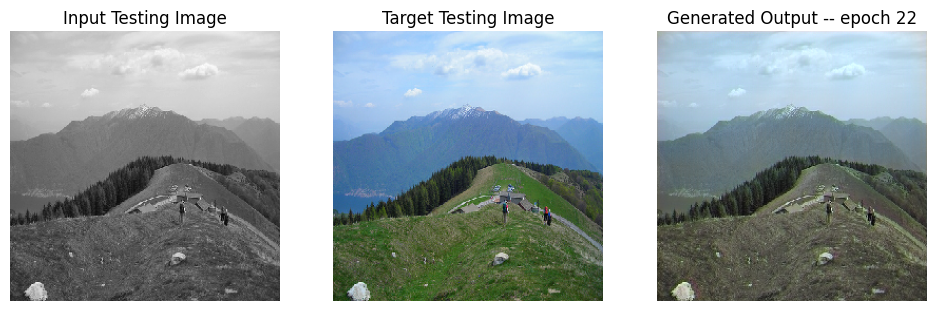

SSIM Score: 0.8921218514442444
PSNR Score: 23.347469329833984
Epoch 22
Training Details
Generator-- total_loss:2.77763 gan_loss:0.00911 l1_loss:0.04152 perceptual_loss:0.00866 Discriminator-- total_loss:10.56946 real_loss:10.56945 generated_loss:0.00002 --- SSIM 0.91445 PSNR 23.28777 LPIPS 0.00000
Time taken for epoch 23 is 529.3547332286835 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.08983 gan_loss:0.00002 l1_loss:0.04646  perceptual_loss:0.00959 Discriminator-- total_loss:16.37113 real_loss:16.37104 generated_loss:0.00009 --- SSIM 0.90989 PSNR 22.91652 LPIPS 0.00000
Time taken for epoch 23 is 609.3452138900757 sec
Number of iteration 125
Epoch 23
Training Details
Generator-- total_loss:2.76115 gan_loss:0.00895 l1_loss:0.04126 perceptual_loss:0.00862 Discriminator-- total_loss:10.35448 real_loss:10.35446 generated_loss:0.00002 --- SSIM 0.91478 PSNR 23.31990 LPIPS 0.00000
Time taken for epoch 24 is 531.7279438972473 sec
Number of iteration 500
Validation Det

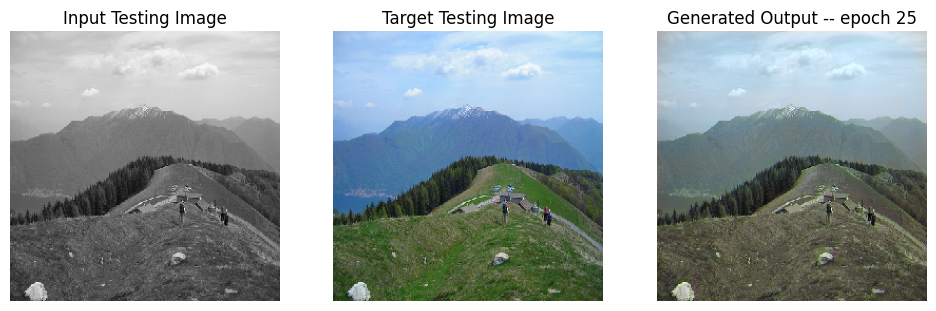

SSIM Score: 0.896935224533081
PSNR Score: 22.804140090942383
Epoch 25
Training Details
Generator-- total_loss:2.74591 gan_loss:0.00816 l1_loss:0.04118 perceptual_loss:0.00849 Discriminator-- total_loss:10.39213 real_loss:10.39211 generated_loss:0.00002 --- SSIM 0.91493 PSNR 23.40049 LPIPS 0.00000
Time taken for epoch 26 is 528.1073467731476 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.02249 gan_loss:0.00003 l1_loss:0.04532  perceptual_loss:0.00946 Discriminator-- total_loss:16.09550 real_loss:16.09540 generated_loss:0.00009 --- SSIM 0.91200 PSNR 23.05623 LPIPS 0.00000
Time taken for epoch 26 is 607.889805316925 sec
Number of iteration 125
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 26.
Epoch 26
Training Details
Generator-- total_loss:11.64458 gan_loss:8.90827 l1_loss:0.04123 perceptual_loss:0.00843 Discriminator-- total_loss:0.07678 real_loss:0.04177 generated_loss:0.03501 --- SSIM 0.91475 PSNR 23.34415 LPIPS 0.00000
Time taken for e

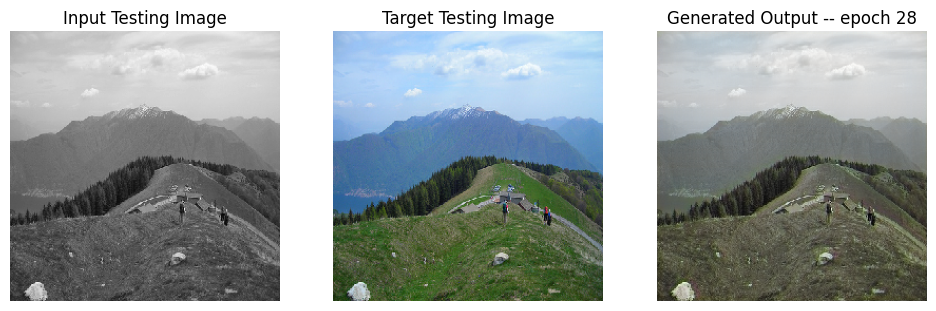

SSIM Score: 0.8982954025268555
PSNR Score: 20.5919189453125
Epoch 28
Training Details
Generator-- total_loss:13.24201 gan_loss:10.49129 l1_loss:0.04129 perceptual_loss:0.00858 Discriminator-- total_loss:0.02597 real_loss:0.01448 generated_loss:0.01149 --- SSIM 0.91342 PSNR 23.30750 LPIPS 0.00000
Time taken for epoch 29 is 398.75083470344543 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.02520 gan_loss:0.00767 l1_loss:0.04558  perceptual_loss:0.00923 Discriminator-- total_loss:7.44302 real_loss:7.43723 generated_loss:0.00579 --- SSIM 0.91358 PSNR 22.94296 LPIPS 0.00000
Time taken for epoch 29 is 478.9542226791382 sec
Number of iteration 125
Epoch 29
Training Details
Generator-- total_loss:13.70726 gan_loss:10.94608 l1_loss:0.04154 perceptual_loss:0.00855 Discriminator-- total_loss:0.00129 real_loss:0.00044 generated_loss:0.00085 --- SSIM 0.91339 PSNR 23.31869 LPIPS 0.00000
Time taken for epoch 30 is 396.4312069416046 sec
Number of iteration 500
Validation Detail

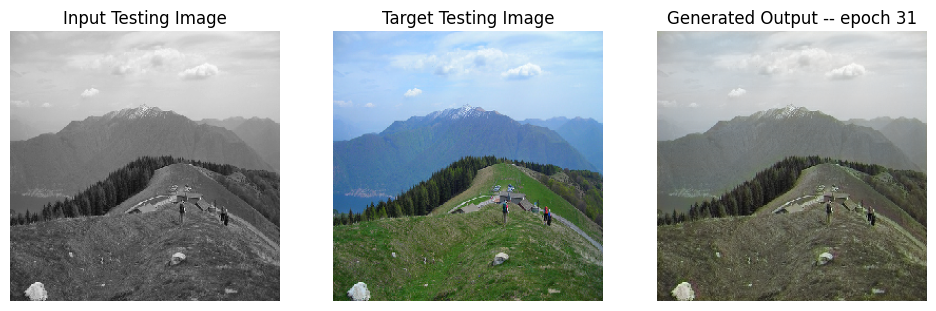

SSIM Score: 0.8983213305473328
PSNR Score: 20.616430282592773
Epoch 31
Training Details
Generator-- total_loss:13.75079 gan_loss:11.00742 l1_loss:0.04135 perceptual_loss:0.00845 Discriminator-- total_loss:0.01380 real_loss:0.00692 generated_loss:0.00688 --- SSIM 0.91359 PSNR 23.32075 LPIPS 0.00000
Time taken for epoch 32 is 402.2468738555908 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.08867 gan_loss:0.00377 l1_loss:0.04682  perceptual_loss:0.00930 Discriminator-- total_loss:8.57803 real_loss:8.57423 generated_loss:0.00381 --- SSIM 0.90976 PSNR 22.84474 LPIPS 0.00000
Time taken for epoch 32 is 483.0433974266052 sec
Number of iteration 125
Epoch 32
Training Details
Generator-- total_loss:14.44023 gan_loss:11.71607 l1_loss:0.04102 perceptual_loss:0.00842 Discriminator-- total_loss:0.00067 real_loss:0.00033 generated_loss:0.00034 --- SSIM 0.91437 PSNR 23.36997 LPIPS 0.00000
Time taken for epoch 33 is 402.6159248352051 sec
Number of iteration 500
Validation Detai

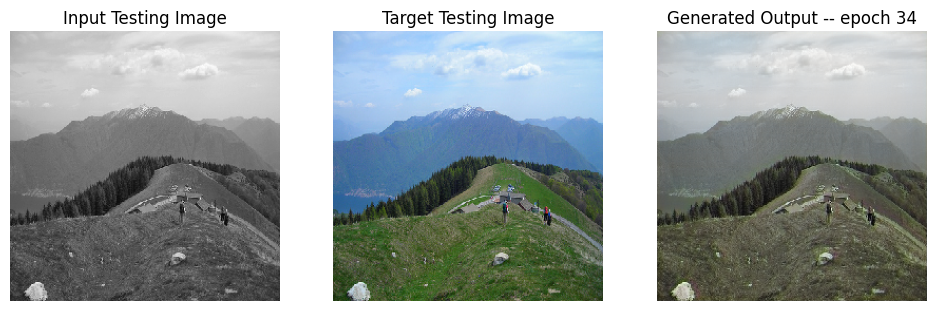

SSIM Score: 0.8982542157173157
PSNR Score: 20.603351593017578
Epoch 34
Training Details
Generator-- total_loss:16.59325 gan_loss:13.83619 l1_loss:0.04154 perceptual_loss:0.00850 Discriminator-- total_loss:0.01283 real_loss:0.00831 generated_loss:0.00452 --- SSIM 0.91284 PSNR 23.28491 LPIPS 0.00000
Time taken for epoch 35 is 401.70405435562134 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.05014 gan_loss:0.00866 l1_loss:0.04615  perceptual_loss:0.00918 Discriminator-- total_loss:9.26272 real_loss:9.26031 generated_loss:0.00241 --- SSIM 0.91097 PSNR 22.89738 LPIPS 0.00000
Time taken for epoch 35 is 482.8980321884155 sec
Number of iteration 125
Epoch 35
Training Details
Generator-- total_loss:17.39693 gan_loss:14.63886 l1_loss:0.04158 perceptual_loss:0.00849 Discriminator-- total_loss:0.00321 real_loss:0.00117 generated_loss:0.00204 --- SSIM 0.91391 PSNR 23.31404 LPIPS 0.00000
Time taken for epoch 36 is 397.959228515625 sec
Number of iteration 500
Validation Detai

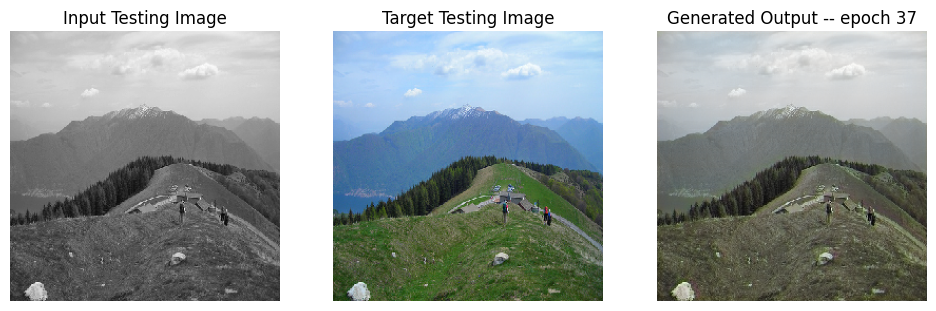

SSIM Score: 0.8982734084129333
PSNR Score: 20.642602920532227
Epoch 37
Training Details
Generator-- total_loss:17.45547 gan_loss:14.67821 l1_loss:0.04181 perceptual_loss:0.00859 Discriminator-- total_loss:0.00019 real_loss:0.00009 generated_loss:0.00010 --- SSIM 0.91262 PSNR 23.24173 LPIPS 0.00000
Time taken for epoch 38 is 400.3039176464081 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.02901 gan_loss:0.00079 l1_loss:0.04592  perceptual_loss:0.00915 Discriminator-- total_loss:11.21160 real_loss:11.21086 generated_loss:0.00075 --- SSIM 0.91159 PSNR 22.96429 LPIPS 0.00000
Time taken for epoch 38 is 482.6840195655823 sec
Number of iteration 125
Epoch 38
Training Details
Generator-- total_loss:18.23752 gan_loss:15.47999 l1_loss:0.04156 perceptual_loss:0.00850 Discriminator-- total_loss:0.00005 real_loss:0.00003 generated_loss:0.00003 --- SSIM 0.91319 PSNR 23.29440 LPIPS 0.00000
Time taken for epoch 39 is 398.55375933647156 sec
Number of iteration 500
Validation De

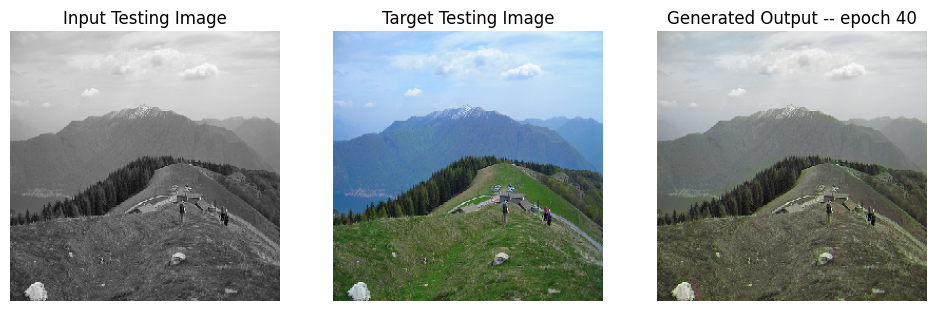

SSIM Score: 0.8983761668205261
PSNR Score: 20.665380477905273
Epoch 40
Training Details
Generator-- total_loss:16.28252 gan_loss:13.56033 l1_loss:0.04098 perceptual_loss:0.00842 Discriminator-- total_loss:0.00035 real_loss:0.00018 generated_loss:0.00016 --- SSIM 0.91524 PSNR 23.35435 LPIPS 0.00000
Time taken for epoch 41 is 398.4528272151947 sec
Number of iteration 500
Validation Details
Generator-- total_loss:2.99269 gan_loss:0.00306 l1_loss:0.04520  perceptual_loss:0.00912 Discriminator-- total_loss:8.40766 real_loss:8.40562 generated_loss:0.00204 --- SSIM 0.91206 PSNR 23.00261 LPIPS 0.00000
Time taken for epoch 41 is 479.35933470726013 sec
Number of iteration 125
Epoch 41
Training Details
Generator-- total_loss:16.72784 gan_loss:13.96224 l1_loss:0.04174 perceptual_loss:0.00848 Discriminator-- total_loss:0.00036 real_loss:0.00012 generated_loss:0.00024 --- SSIM 0.91257 PSNR 23.27898 LPIPS 0.00000
Time taken for epoch 42 is 399.4382674694061 sec
Number of iteration 500
Validation Deta

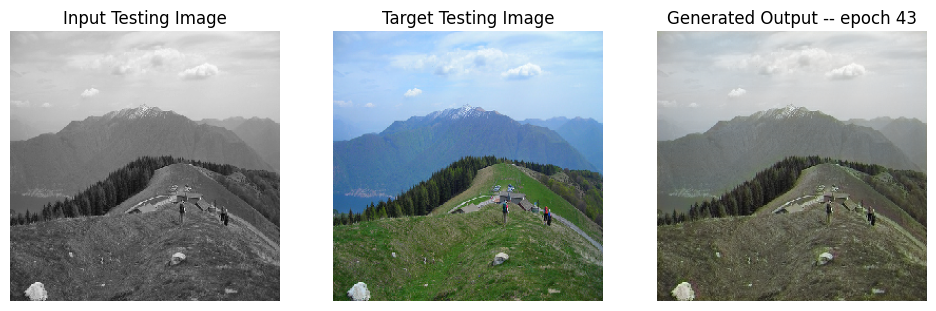

SSIM Score: 0.8983755707740784
PSNR Score: 20.58560562133789
Epoch 43
Training Details
Generator-- total_loss:17.74392 gan_loss:14.99009 l1_loss:0.04156 perceptual_loss:0.00845 Discriminator-- total_loss:0.00007 real_loss:0.00003 generated_loss:0.00004 --- SSIM 0.91392 PSNR 23.27213 LPIPS 0.00000
Time taken for epoch 44 is 398.66229367256165 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.01358 gan_loss:0.00134 l1_loss:0.04565  perceptual_loss:0.00912 Discriminator-- total_loss:9.68581 real_loss:9.68494 generated_loss:0.00087 --- SSIM 0.91255 PSNR 22.97367 LPIPS 0.00000
Time taken for epoch 44 is 479.94521713256836 sec
Number of iteration 125
Epoch 44
Training Details
Generator-- total_loss:17.57316 gan_loss:14.80269 l1_loss:0.04171 perceptual_loss:0.00856 Discriminator-- total_loss:0.00474 real_loss:0.00117 generated_loss:0.00357 --- SSIM 0.91320 PSNR 23.26470 LPIPS 0.00000
Time taken for epoch 45 is 401.6655864715576 sec
Number of iteration 500
Validation Deta

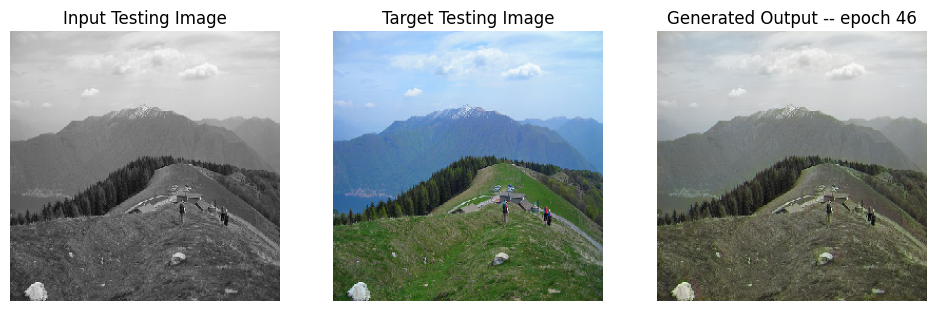

SSIM Score: 0.8983531594276428
PSNR Score: 20.612560272216797
Epoch 46
Training Details
Generator-- total_loss:16.35557 gan_loss:13.59998 l1_loss:0.04143 perceptual_loss:0.00855 Discriminator-- total_loss:0.00039 real_loss:0.00019 generated_loss:0.00020 --- SSIM 0.91393 PSNR 23.32871 LPIPS 0.00000
Time taken for epoch 47 is 401.00421237945557 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.05568 gan_loss:0.00354 l1_loss:0.04624  perceptual_loss:0.00925 Discriminator-- total_loss:9.00770 real_loss:9.00652 generated_loss:0.00118 --- SSIM 0.91086 PSNR 22.82710 LPIPS 0.00000
Time taken for epoch 47 is 482.85121607780457 sec
Number of iteration 125
Epoch 47
Training Details
Generator-- total_loss:16.59861 gan_loss:13.87134 l1_loss:0.04111 perceptual_loss:0.00840 Discriminator-- total_loss:0.00019 real_loss:0.00011 generated_loss:0.00008 --- SSIM 0.91420 PSNR 23.36549 LPIPS 0.00000
Time taken for epoch 48 is 397.4812173843384 sec
Number of iteration 500
Validation Det

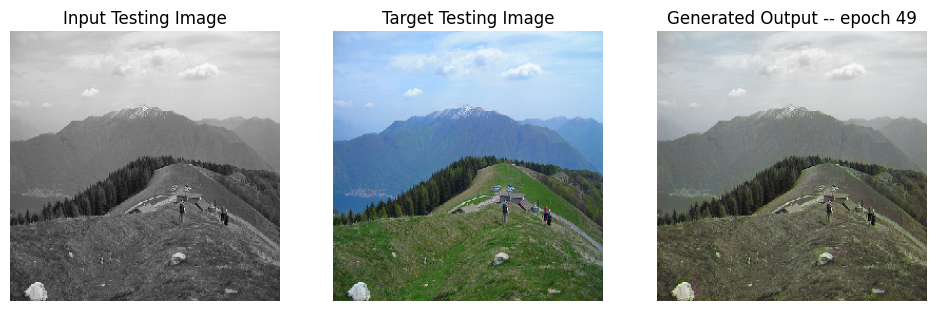

SSIM Score: 0.8983035087585449
PSNR Score: 20.650920867919922
Epoch 49
Training Details
Generator-- total_loss:17.54193 gan_loss:14.78711 l1_loss:0.04140 perceptual_loss:0.00856 Discriminator-- total_loss:0.00006 real_loss:0.00003 generated_loss:0.00003 --- SSIM 0.91387 PSNR 23.34709 LPIPS 0.00000
Time taken for epoch 50 is 397.8549439907074 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.03803 gan_loss:0.00164 l1_loss:0.04583  perceptual_loss:0.00931 Discriminator-- total_loss:9.84359 real_loss:9.84269 generated_loss:0.00091 --- SSIM 0.91195 PSNR 22.93177 LPIPS 0.00000
Time taken for epoch 50 is 479.61440229415894 sec
Number of iteration 125
Epoch 50
Training Details
Generator-- total_loss:17.71985 gan_loss:14.97238 l1_loss:0.04142 perceptual_loss:0.00845 Discriminator-- total_loss:0.00007 real_loss:0.00003 generated_loss:0.00004 --- SSIM 0.91419 PSNR 23.32475 LPIPS 0.00000
Time taken for epoch 51 is 401.2193658351898 sec
Number of iteration 500
Validation Deta

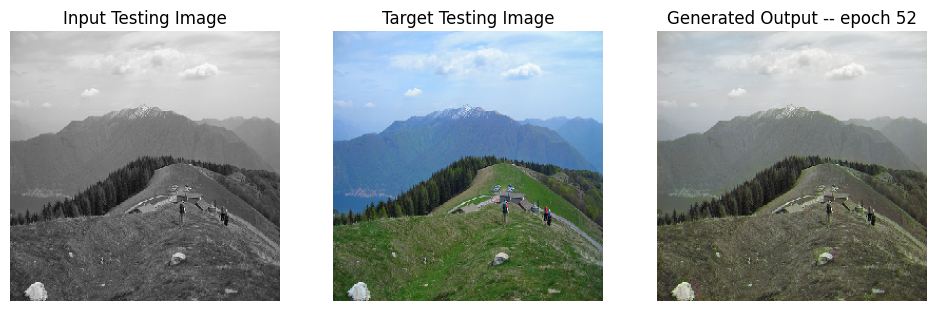

SSIM Score: 0.8983581066131592
PSNR Score: 20.61725616455078
Epoch 52
Training Details
Generator-- total_loss:19.03639 gan_loss:16.28337 l1_loss:0.04160 perceptual_loss:0.00841 Discriminator-- total_loss:0.00018 real_loss:0.00007 generated_loss:0.00011 --- SSIM 0.91371 PSNR 23.30089 LPIPS 0.00000
Time taken for epoch 53 is 393.8962230682373 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.01056 gan_loss:0.00114 l1_loss:0.04577  perceptual_loss:0.00901 Discriminator-- total_loss:10.44545 real_loss:10.44482 generated_loss:0.00062 --- SSIM 0.91031 PSNR 22.97039 LPIPS 0.00000
Time taken for epoch 53 is 474.8134105205536 sec
Number of iteration 125
Epoch 53
Training Details
Generator-- total_loss:19.26674 gan_loss:16.50663 l1_loss:0.04158 perceptual_loss:0.00851 Discriminator-- total_loss:0.00008 real_loss:0.00003 generated_loss:0.00004 --- SSIM 0.91369 PSNR 23.26537 LPIPS 0.00000
Time taken for epoch 54 is 394.7992947101593 sec
Number of iteration 500
Validation Deta

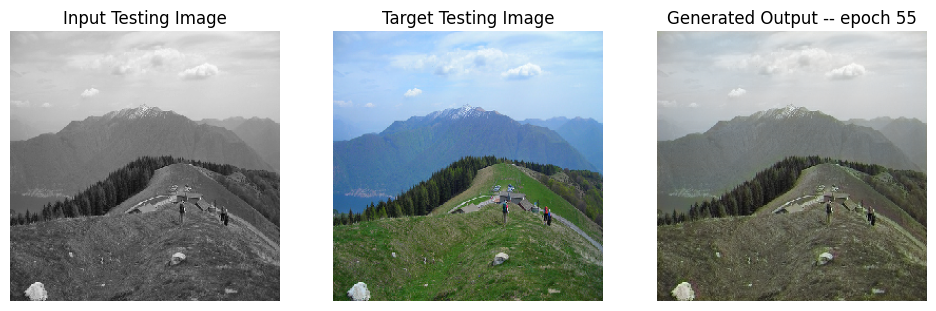

SSIM Score: 0.8984510898590088
PSNR Score: 20.66634750366211
Epoch 55
Training Details
Generator-- total_loss:19.94058 gan_loss:17.18134 l1_loss:0.04140 perceptual_loss:0.00862 Discriminator-- total_loss:0.00005 real_loss:0.00002 generated_loss:0.00003 --- SSIM 0.91278 PSNR 23.30865 LPIPS 0.00000
Time taken for epoch 56 is 396.8358931541443 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.02444 gan_loss:0.00029 l1_loss:0.04596  perceptual_loss:0.00908 Discriminator-- total_loss:11.97692 real_loss:11.97659 generated_loss:0.00033 --- SSIM 0.91213 PSNR 22.96624 LPIPS 0.00000
Time taken for epoch 56 is 478.4224157333374 sec
Number of iteration 125
Epoch 56
Training Details
Generator-- total_loss:19.87363 gan_loss:17.13229 l1_loss:0.04125 perceptual_loss:0.00849 Discriminator-- total_loss:0.00004 real_loss:0.00001 generated_loss:0.00002 --- SSIM 0.91410 PSNR 23.31393 LPIPS 0.00000
Time taken for epoch 57 is 393.71084213256836 sec
Number of iteration 500
Validation Det

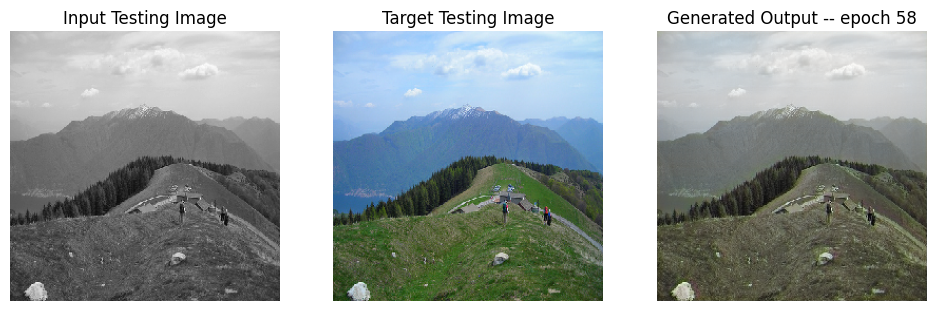

SSIM Score: 0.8982387185096741
PSNR Score: 20.524240493774414
Epoch 58
Training Details
Generator-- total_loss:21.39513 gan_loss:18.65163 l1_loss:0.04139 perceptual_loss:0.00842 Discriminator-- total_loss:0.02214 real_loss:0.01176 generated_loss:0.01038 --- SSIM 0.91358 PSNR 23.28733 LPIPS 0.00000
Time taken for epoch 59 is 396.6418294906616 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.12844 gan_loss:0.00096 l1_loss:0.04755  perceptual_loss:0.00937 Discriminator-- total_loss:11.05509 real_loss:11.05445 generated_loss:0.00065 --- SSIM 0.90765 PSNR 22.64832 LPIPS 0.00000
Time taken for epoch 59 is 477.6639232635498 sec
Number of iteration 125
Epoch 59
Training Details
Generator-- total_loss:22.77884 gan_loss:20.04311 l1_loss:0.04112 perceptual_loss:0.00849 Discriminator-- total_loss:0.00054 real_loss:0.00023 generated_loss:0.00031 --- SSIM 0.91476 PSNR 23.34424 LPIPS 0.00000
Time taken for epoch 60 is 397.97912406921387 sec
Number of iteration 500
Validation De

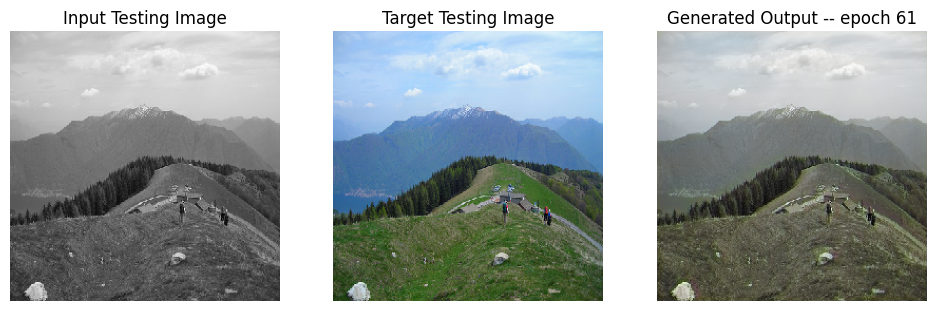

SSIM Score: 0.8983091711997986
PSNR Score: 20.617624282836914
Epoch 61
Training Details
Generator-- total_loss:22.86671 gan_loss:20.10900 l1_loss:0.04155 perceptual_loss:0.00850 Discriminator-- total_loss:0.00004 real_loss:0.00002 generated_loss:0.00002 --- SSIM 0.91328 PSNR 23.29274 LPIPS 0.00000
Time taken for epoch 62 is 394.26281690597534 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.07521 gan_loss:0.00028 l1_loss:0.04669  perceptual_loss:0.00926 Discriminator-- total_loss:13.04511 real_loss:13.04486 generated_loss:0.00025 --- SSIM 0.91008 PSNR 22.84174 LPIPS 0.00000
Time taken for epoch 62 is 475.5656991004944 sec
Number of iteration 125
Epoch 62
Training Details
Generator-- total_loss:23.09505 gan_loss:20.32318 l1_loss:0.04180 perceptual_loss:0.00853 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.91366 PSNR 23.26598 LPIPS 0.00000
Time taken for epoch 63 is 395.71411514282227 sec
Number of iteration 500
Validation D

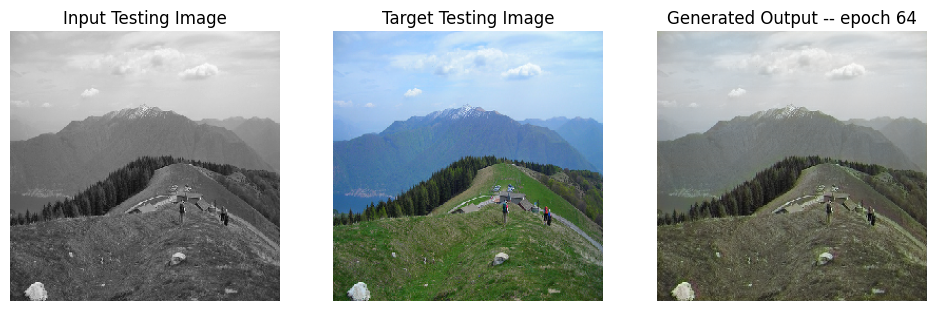

SSIM Score: 0.8982858657836914
PSNR Score: 20.63394546508789
Epoch 64
Training Details
Generator-- total_loss:23.60644 gan_loss:20.84273 l1_loss:0.04162 perceptual_loss:0.00854 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00000 --- SSIM 0.91314 PSNR 23.27837 LPIPS 0.00000
Time taken for epoch 65 is 395.1851558685303 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.06258 gan_loss:0.00032 l1_loss:0.04642  perceptual_loss:0.00927 Discriminator-- total_loss:13.07029 real_loss:13.07011 generated_loss:0.00018 --- SSIM 0.91084 PSNR 22.82323 LPIPS 0.00000
Time taken for epoch 65 is 476.47707653045654 sec
Number of iteration 125
Epoch 65
Training Details
Generator-- total_loss:15.44553 gan_loss:12.71787 l1_loss:0.04111 perceptual_loss:0.00840 Discriminator-- total_loss:0.11301 real_loss:0.07938 generated_loss:0.03363 --- SSIM 0.91331 PSNR 23.35451 LPIPS 0.00000
Time taken for epoch 66 is 393.25293731689453 sec
Number of iteration 500
Validation De

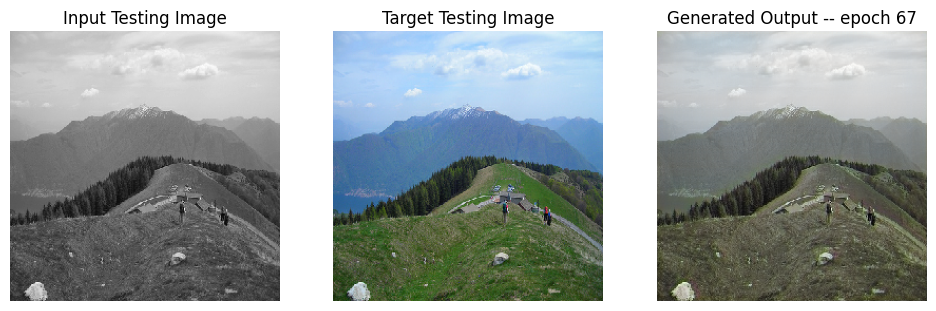

SSIM Score: 0.8982239365577698
PSNR Score: 20.57356071472168
Epoch 67
Training Details
Generator-- total_loss:16.36792 gan_loss:13.60176 l1_loss:0.04165 perceptual_loss:0.00854 Discriminator-- total_loss:0.00231 real_loss:0.00135 generated_loss:0.00096 --- SSIM 0.91330 PSNR 23.26245 LPIPS 0.00000
Time taken for epoch 68 is 393.6559534072876 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.07958 gan_loss:0.02896 l1_loss:0.04623  perceptual_loss:0.00924 Discriminator-- total_loss:5.27924 real_loss:5.24737 generated_loss:0.03188 --- SSIM 0.91028 PSNR 22.89690 LPIPS 0.00000
Time taken for epoch 68 is 474.7804226875305 sec
Number of iteration 125
Epoch 68
Training Details
Generator-- total_loss:16.29075 gan_loss:13.52400 l1_loss:0.04171 perceptual_loss:0.00852 Discriminator-- total_loss:0.00430 real_loss:0.00200 generated_loss:0.00230 --- SSIM 0.91296 PSNR 23.26279 LPIPS 0.00000
Time taken for epoch 69 is 393.13949251174927 sec
Number of iteration 500
Validation Detai

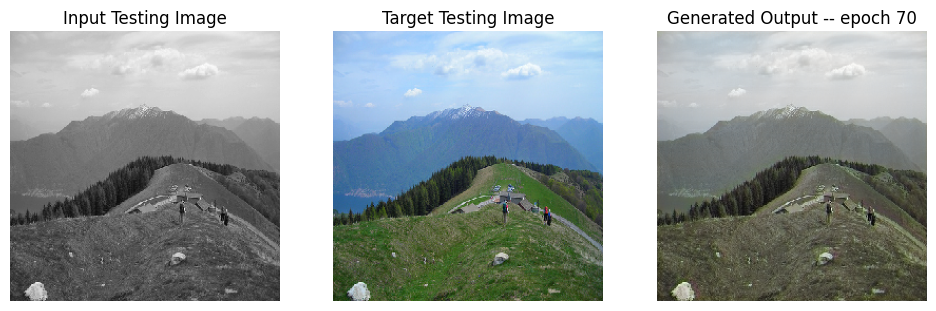

SSIM Score: 0.8983001708984375
PSNR Score: 20.59531593322754
Epoch 70
Training Details
Generator-- total_loss:16.43194 gan_loss:13.70234 l1_loss:0.04111 perceptual_loss:0.00843 Discriminator-- total_loss:0.00020 real_loss:0.00009 generated_loss:0.00010 --- SSIM 0.91397 PSNR 23.34704 LPIPS 0.00000
Time taken for epoch 71 is 391.0463283061981 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.06823 gan_loss:0.00179 l1_loss:0.04630  perceptual_loss:0.00939 Discriminator-- total_loss:8.85674 real_loss:8.85545 generated_loss:0.00130 --- SSIM 0.91089 PSNR 22.85683 LPIPS 0.00000
Time taken for epoch 71 is 471.7918071746826 sec
Number of iteration 125
Epoch 71
Training Details
Generator-- total_loss:17.30270 gan_loss:14.56155 l1_loss:0.04134 perceptual_loss:0.00843 Discriminator-- total_loss:0.00009 real_loss:0.00004 generated_loss:0.00004 --- SSIM 0.91427 PSNR 23.34018 LPIPS 0.00000
Time taken for epoch 72 is 395.2347631454468 sec
Number of iteration 500
Validation Detail

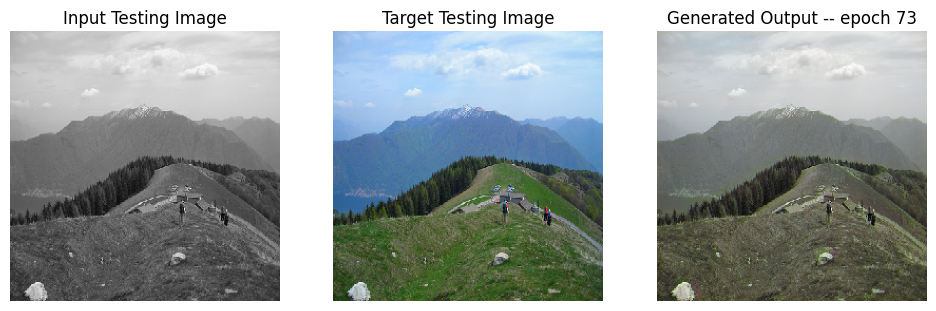

SSIM Score: 0.8981611132621765
PSNR Score: 20.505264282226562
Reduced generator learning rate to 0.0002025000096182339 at epoch 73
Epoch 73
Training Details
Generator-- total_loss:2.89465 gan_loss:0.04629 l1_loss:0.04316 perceptual_loss:0.00863 Discriminator-- total_loss:10.62680 real_loss:10.62665 generated_loss:0.00015 --- SSIM 0.90849 PSNR 22.95801 LPIPS 0.00000
Time taken for epoch 74 is 528.4750330448151 sec
Number of iteration 500
Validation Details
Generator-- total_loss:3.12135 gan_loss:0.00011 l1_loss:0.04758  perceptual_loss:0.00928 Discriminator-- total_loss:14.35298 real_loss:14.35291 generated_loss:0.00006 --- SSIM 0.90580 PSNR 22.61886 LPIPS 0.00000
Time taken for epoch 74 is 609.4056346416473 sec
Number of iteration 125
Epoch 74
Training Details
Generator-- total_loss:2.80341 gan_loss:0.00980 l1_loss:0.04200 perceptual_loss:0.00867 Discriminator-- total_loss:9.50836 real_loss:9.50835 generated_loss:0.00001 --- SSIM 0.91140 PSNR 23.23226 LPIPS 0.00000
Time taken for epoch

In [46]:
fit(train_dataset, epochs, validation_dataset, gen)

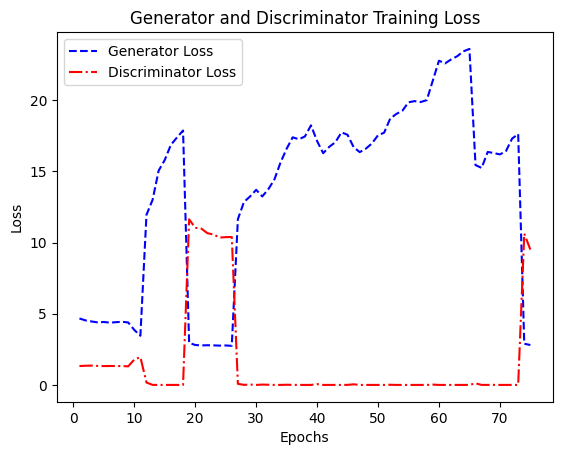

In [47]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

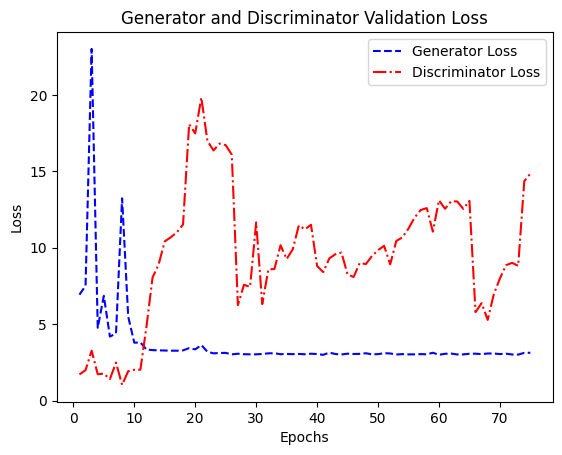

In [48]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

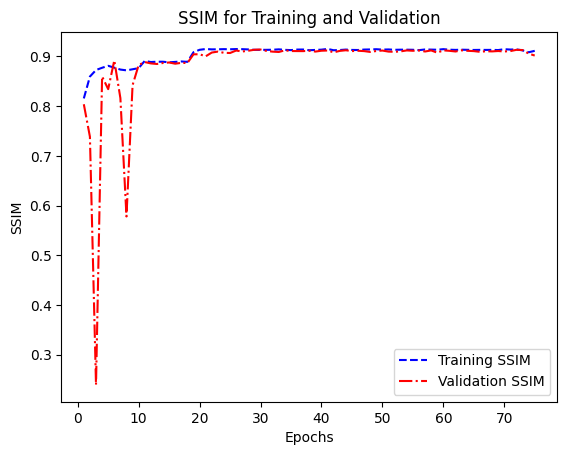

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

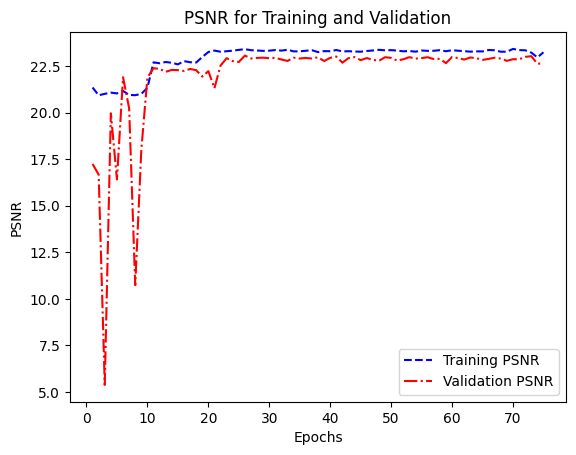

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

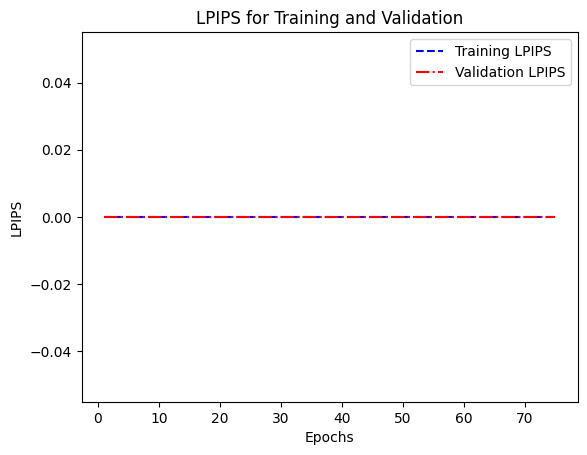

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.r', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

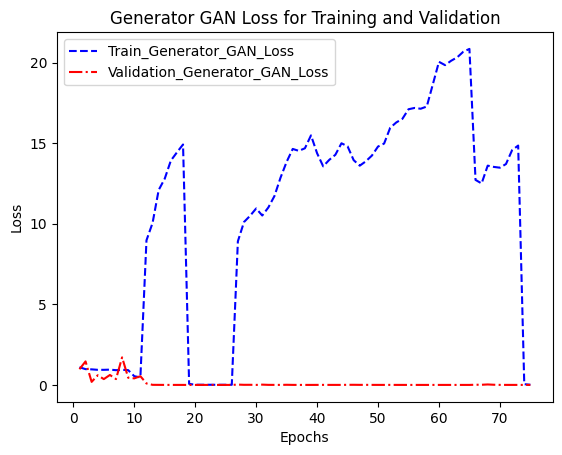

In [52]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

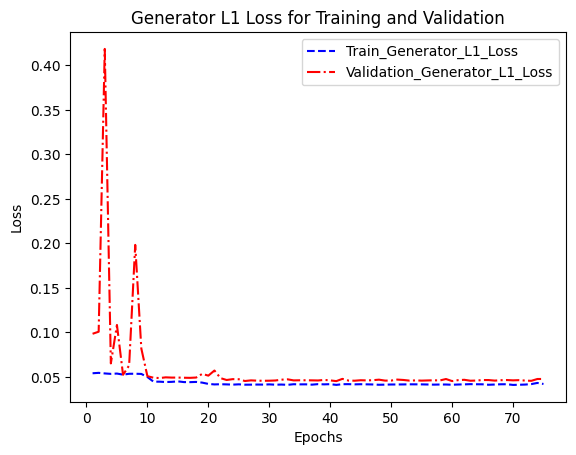

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

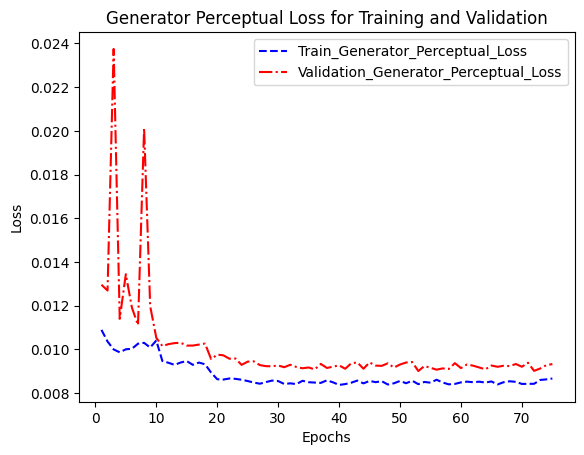

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.r', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

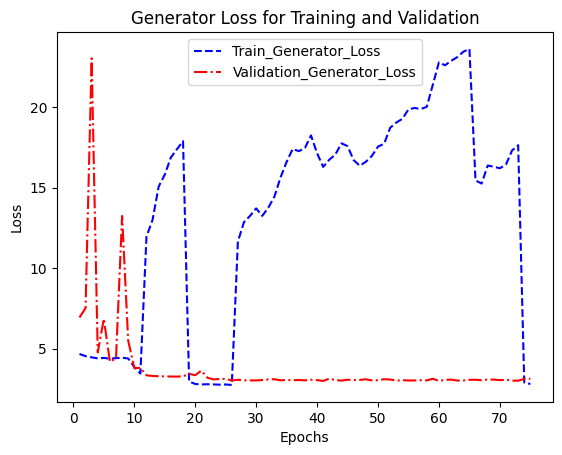

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

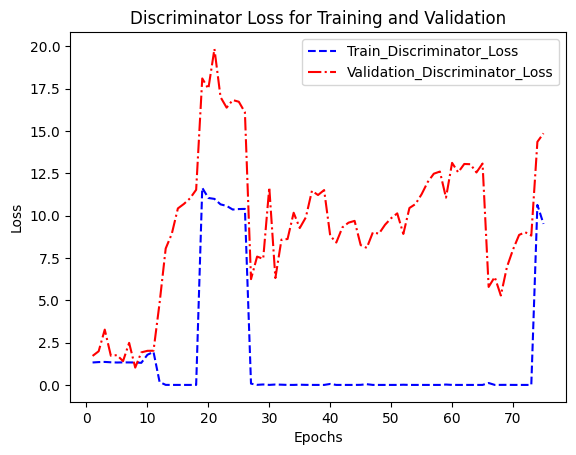

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

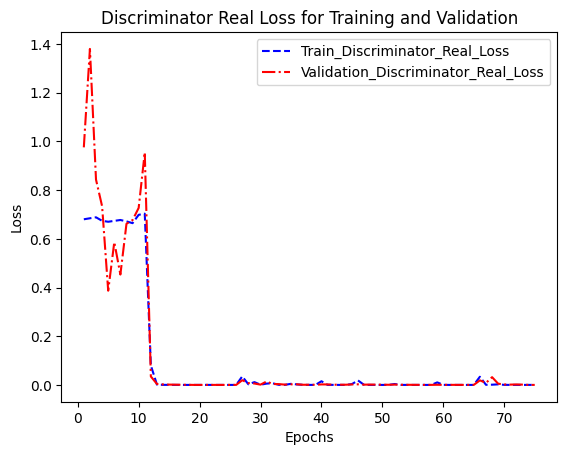

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

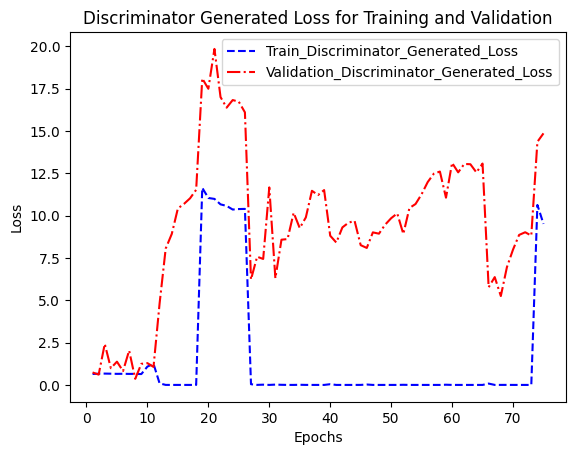

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [59]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [60]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [61]:
os.mkdir('/kaggle/working/modelsFeb7')

In [62]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [63]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [64]:
import subprocess
from IPython.display import FileLink, display

In [65]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip